In [69]:
import numpy as np
import math 
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation, PillowWriter
import pandas as pd
import plotly.express as px

In [70]:
class Mass():
    def __init__(self, x,y, mass):
        self.x = x
        self.y = y
        self.accelX = 0
        self.accelY = 0
        self.velX = 0
        self.velY = 0
        self.mass = mass

class Spring():
    def __init__(self, equilLength, k):
        self.equilLength = equilLength
        self.k = k

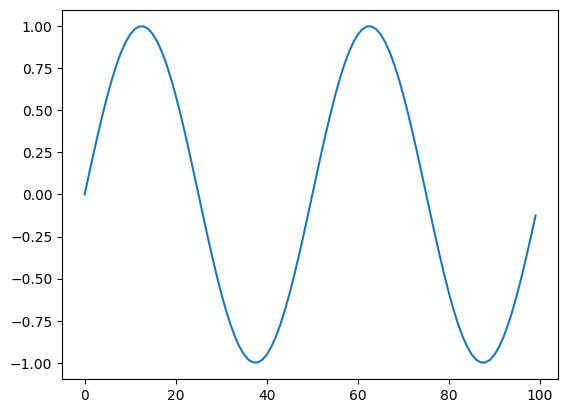

In [79]:
# Setting up masses
masses = []
springs = []

startPos =  (0,0)
pickedPoint = (50,10)


numOfMasses = 100
fullLengthPulled = 100

endPos = (startPos[0] + fullLengthPulled, startPos[1])

k = 10000
eachMassLength = fullLengthPulled/numOfMasses
equiplibreiumLength = 60
equiplibreiumLengthPerMass = equiplibreiumLength/numOfMasses
totalMass = 1
massPerMass = totalMass/numOfMasses

for i in range(numOfMasses):
    masses.append(Mass(startPos[0] + i * eachMassLength, startPos[1], massPerMass))
for i in range(1,numOfMasses):
    springs.append(Spring(equiplibreiumLengthPerMass, k))

#Line pick

# for i, mass in enumerate(masses):
#     if mass.x < pickedPoint[0]:
#         mass.y = ((pickedPoint[1] - startPos[1])/(pickedPoint[0] - startPos[0]))*(mass.x - startPos[0]) + startPos[1]
#     elif mass.x > pickedPoint[0]:
#         mass.y = ((endPos[1] - pickedPoint[1])/(endPos[0] - pickedPoint[0]))*(mass.x - pickedPoint[0]) + pickedPoint[1]
#     else:
#         masses[i].y = pickedPoint[1]

# Sin wave
nodes = 2
for i, mass in enumerate(masses):
   mass.y = math.sin(mass.x * 2 * math.pi * 2/numOfMasses)

#guasNum = 30
#damp = 30000000
#length = 50
#startI = round(numOfMasses/2) - round(guasNum/2)
#for i in range(guasNum):
    #springs[int(startI + i)].y = (math.e**-((i + length)**2)/length)*damp
    #print((math.e**-((i)**2)/length)*damp)

xs = [i.x for i in masses]
ys = [i.y for i in masses]
plt.plot(xs, ys)

In [72]:
df = px.data.gapminder()
print(df[100:])

         country continent  year  lifeExp        pop   gdpPercap iso_alpha  \
100   Bangladesh      Asia  1972   45.252   70759295  630.233627       BGD   
101   Bangladesh      Asia  1977   46.923   80428306  659.877232       BGD   
102   Bangladesh      Asia  1982   50.009   93074406  676.981866       BGD   
103   Bangladesh      Asia  1987   52.819  103764241  751.979403       BGD   
104   Bangladesh      Asia  1992   56.018  113704579  837.810164       BGD   
...          ...       ...   ...      ...        ...         ...       ...   
1699    Zimbabwe    Africa  1987   62.351    9216418  706.157306       ZWE   
1700    Zimbabwe    Africa  1992   60.377   10704340  693.420786       ZWE   
1701    Zimbabwe    Africa  1997   46.809   11404948  792.449960       ZWE   
1702    Zimbabwe    Africa  2002   39.989   11926563  672.038623       ZWE   
1703    Zimbabwe    Africa  2007   43.487   12311143  469.709298       ZWE   

      iso_num  
100        50  
101        50  
102        50  

In [80]:
dt = 0.001

def sim():
    for i in range(1, len(masses) - 1):
        mass = masses[i]
        spring = springs[i]

        #Force steps
        forcesX = []
        forcesY = []
        for j in [1,-1]:
            difBehindY = (masses[i].y - masses[i + j].y)
            difBehindX = (masses[i].x - masses[i + j].x)
            forceBehind = k * np.abs(spring.equilLength - np.sqrt(difBehindY**2 + difBehindX**2))
            forceBehindAngle = math.atan2(difBehindY,difBehindX) - math.radians(180)
            forceBehindX = forceBehind*np.cos(forceBehindAngle)
            forceBehindY = forceBehind*np.sin(forceBehindAngle)
            forcesX.append(forceBehindX)
            forcesY.append(forceBehindY)

        #mass.accelX = (sum(forcesX))/mass.mass
        mass.accelY = (sum(forcesY))/mass.mass

        #Acceleration steps
        #mass.velX += mass.accelX * dt
        mass.velY += mass.accelY * dt

        #mass.x += mass.velX * dt
    for i in range(1, len(masses) - 1):
        mass = masses[i]
        mass.y += mass.velY * dt

pos = {'x' : [], 'y' : [], 'time' : [], 'id' : []}
#data = pd.DataFrame(pos)
for i in range(1000):
    sim()
    for num, j in enumerate(masses):
        pos['x'].append(j.x)
        pos['y'].append(j.y)
        pos['time'].append(i)
        pos['id'].append(num)
        #data.loc[len(data.index)] = [j.x, j.y, i, num]
print(pos['y'][75])
#fig = px.line(pos, x="x", y="y", title='is a stirng', animation_frame="time", hover_name='id')
fig = px.scatter(pos, x="x", y="y", title='is a stirng', animation_frame="time", hover_name='id')
fig.layout.xaxis.range = (-0,fullLengthPulled)
fig.layout.yaxis.range = (-1,1)
fig.show()



#animation = FuncAnimation(fig, sim, frames = range(1,500))
#animation.save("spring.gif", dpi = 300, writer = PillowWriter(fps=30))

3.1623496276947874e-16


In [81]:
data = pd.DataFrame(pos)
slice = data.loc[data['time'] == 627]
print(slice)

from scipy.fftpack import fft #fast fourier transform
FT = np.abs(np.fft.hfft(slice['y']))
FTdata = pd.DataFrame(FT)
print(FTdata)
figFT = px.bar(FT)
figFT.show()

          x         y  time  id
62700   0.0  0.000000   627   0
62701   1.0  0.113288   627   1
62702   2.0  0.225403   627   2
62703   3.0  0.335375   627   3
62704   4.0  0.441888   627   4
...     ...       ...   ...  ..
62795  95.0 -0.547559   627  95
62796  96.0 -0.447651   627  96
62797  97.0 -0.342794   627  97
62798  98.0 -0.234839   627  98
62799  99.0 -0.125333   627  99

[100 rows x 4 columns]
             0
0     0.036718
1    31.897395
2     0.078381
3    70.189987
4     5.916304
..         ...
193  50.522249
194   5.916304
195  70.189987
196   0.078381
197  31.897395

[198 rows x 1 columns]


-0.00019999999999968377


          x         y  time  id
62700   0.0  0.000000   627   0
62701   1.0  0.107369   627   1
62702   2.0  0.214252   627   2
62703   3.0  0.319812   627   3
62704   4.0  0.422940   627   4
...     ...       ...   ...  ..
62795  95.0 -0.555836   627  95
62796  96.0 -0.455177   627  96
62797  97.0 -0.348643   627  97
62798  98.0 -0.238130   627  98
62799  99.0 -0.125333   627  99

[100 rows x 4 columns]
             0
0     0.711756
1    31.602349
2     0.093642
3    69.691721
4     6.123909
..         ...
193  50.303783
194   6.123909
195  69.691721
196   0.093642
197  31.602349

[198 rows x 1 columns]


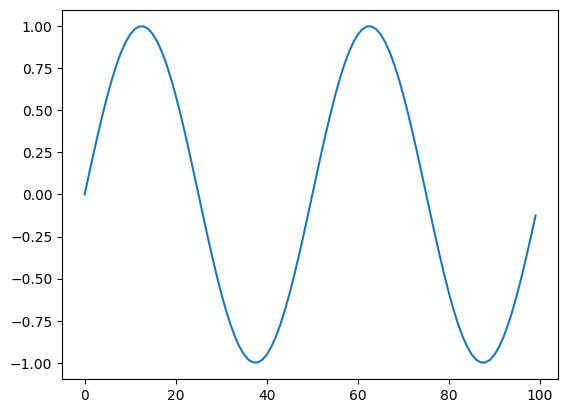

In [86]:
#GRAVITY

# Setting up masses
masses = []
springs = []

startPos =  (0,0)
pickedPoint = (50,10)


numOfMasses = 100
fullLengthPulled = 100

endPos = (startPos[0] + fullLengthPulled, startPos[1])

k = 10000
eachMassLength = fullLengthPulled/numOfMasses
equiplibreiumLength = 60
equiplibreiumLengthPerMass = equiplibreiumLength/numOfMasses
totalMass = 1
massPerMass = totalMass/numOfMasses

for i in range(numOfMasses):
    masses.append(Mass(startPos[0] + i * eachMassLength, startPos[1], massPerMass))
for i in range(1,numOfMasses):
    springs.append(Spring(equiplibreiumLengthPerMass, k))

#Line pick

# for i, mass in enumerate(masses):
#     if mass.x < pickedPoint[0]:
#         mass.y = ((pickedPoint[1] - startPos[1])/(pickedPoint[0] - startPos[0]))*(mass.x - startPos[0]) + startPos[1]
#     elif mass.x > pickedPoint[0]:
#         mass.y = ((endPos[1] - pickedPoint[1])/(endPos[0] - pickedPoint[0]))*(mass.x - pickedPoint[0]) + pickedPoint[1]
#     else:
#         masses[i].y = pickedPoint[1]

# Sin wave
nodes = 2
for i, mass in enumerate(masses):
   mass.y = math.sin(mass.x * 2 * math.pi * 2/numOfMasses)

#guasNum = 30
#damp = 30000000
#length = 50
#startI = round(numOfMasses/2) - round(guasNum/2)
#for i in range(guasNum):
    #springs[int(startI + i)].y = (math.e**-((i + length)**2)/length)*damp
    #print((math.e**-((i)**2)/length)*damp)

xs = [i.x for i in masses]
ys = [i.y for i in masses]
plt.plot(xs, ys)

dt = 0.001
g = 100

def sim():
    for i in range(1, len(masses) - 1):
        mass = masses[i]
        spring = springs[i]

        #Force steps
        forcesX = []
        forcesY = []
        for j in [1,-1]:
            difBehindY = (masses[i].y - masses[i + j].y)
            difBehindX = (masses[i].x - masses[i + j].x)
            forceBehind = k * np.abs(spring.equilLength - np.sqrt(difBehindY**2 + difBehindX**2))
            forceBehindAngle = math.atan2(difBehindY,difBehindX) - math.radians(180)
            #forceBehindX = forceBehind*np.cos(forceBehindAngle)
            forceBehindY = forceBehind*np.sin(forceBehindAngle)
            #forcesX.append(forceBehindX)
            forcesY.append(forceBehindY)
            gravity = -mass.mass*g
            forcesY.append(gravity)

        #mass.accelX = (sum(forcesX))/mass.mass
        mass.accelY = (sum(forcesY))/mass.mass

        #Acceleration steps
        #mass.velX += mass.accelX * dt
        mass.velY += mass.accelY * dt

        #mass.x += mass.velX * dt
    for i in range(1, len(masses) - 1):
        mass = masses[i]
        mass.y += mass.velY * dt

pos = {'x' : [], 'y' : [], 'time' : [], 'id' : []}
#data = pd.DataFrame(pos)
for i in range(1000):
    sim()
    for num, j in enumerate(masses):
        pos['x'].append(j.x)
        pos['y'].append(j.y)
        pos['time'].append(i)
        pos['id'].append(num)
        #data.loc[len(data.index)] = [j.x, j.y, i, num]
print(pos['y'][75])
#fig = px.line(pos, x="x", y="y", title='is a stirng', animation_frame="time", hover_name='id')
fig = px.scatter(pos, x="x", y="y", title='is a stirng', animation_frame="time", hover_name='id')
fig.layout.xaxis.range = (-0,fullLengthPulled)
fig.layout.yaxis.range = (-1,1)
fig.show()


data = pd.DataFrame(pos)
slice = data.loc[data['time'] == 627]
print(slice)

from scipy.fftpack import fft #fast fourier transform
FT = np.abs(np.fft.hfft(slice['y']))
FTdata = pd.DataFrame(FT)
print(FTdata)
figFT = px.bar(FT)
figFT.show()

#animation = FuncAnimation(fig, sim, frames = range(1,500))
#animation.save("spring.gif", dpi = 300, writer = PillowWriter(fps=30))